In [ ]:
!pip -q install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 663.2/663.2 kB 9.9 MB/s eta 0:00:00


In [ ]:
# Dowbload the sample
!wget https://ultralytics.com/images/bus.jpg

--2023-12-28 14:39:37--  https://ultralytics.com/images/bus.jpg
Resolving ultralytics.com (ultralytics.com)... 99.83.190.102, 75.2.70.75
Connecting to ultralytics.com (ultralytics.com)|99.83.190.102|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://www.ultralytics.com/images/bus.jpg [following]
--2023-12-28 14:39:37--  https://www.ultralytics.com/images/bus.jpg
Resolving www.ultralytics.com (www.ultralytics.com)... 104.18.1.125, 104.18.0.125, 2606:4700::6812:7d, ...
Connecting to www.ultralytics.com (www.ultralytics.com)|104.18.1.125|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://raw.githubusercontent.com/ultralytics/yolov5/master/data/images/bus.jpg [following]
--2023-12-28 14:39:38--  https://raw.githubusercontent.com/ultralytics/yolov5/master/data/images/bus.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.111.133, 185.199.109.133, ...
C

In [ ]:
import os
import cv2
from PIL import Image
import matplotlib.pyplot as plt


plt.rcParams['figure.figsize'] = (8, 8*1.3333)

In [ ]:
def show_img(result):
  for r in results:
      im_array = r.plot()  # plot a BGR numpy array of predictions
      im = Image.fromarray(im_array[..., ::-1])  # RGB PIL image
      im.show()  # show image
      im.save('results.jpg')  # save image

  plt.imshow(im, aspect='auto')

# YOLOv3

PRO TIP 💡 Replace 'model=yolov3.pt' with new 'model=yolov3u.pt'.
YOLOv5 'u' models are trained with https://github.com/ultralytics/ultralytics and feature improved performance vs standard YOLOv5 models trained with https://github.com/ultralytics/yolov5.



100%|██████████| 198M/198M [00:00<00:00, 302MB/s]



WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/1 /content/bus.jpg: 640x480 5 persons, 1 bus, 215.5ms
Speed: 14.2ms preprocess, 215.5ms inference, 1755.7ms postprocess per image at shape (1, 3, 640, 480)


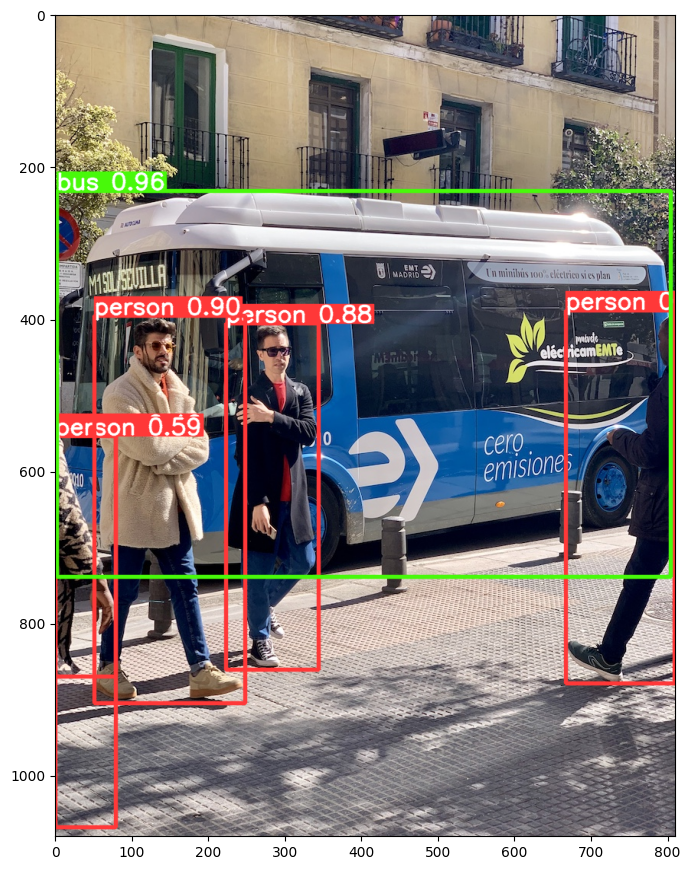

In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO('yolov3.pt')  # load an official model

# Predict with the model
results = model('/content/bus.jpg')

show_img(results)

# YOLOv4

In [ ]:
!cd /content
!rm -fr darknet
!git clone https://github.com/AlexeyAB/darknet/
%cd darknet
!sed -i 's/OPENCV=0/OPENCV=1/g' Makefile
!sed -i 's/GPU=0/GPU=1/g' Makefile
!sed -i 's/CUDNN=0/CUDNN=1/g' Makefile
!sed -i 's/CUDNN_HALF=0/CUDNN_HALF=1/g' Makefile
!apt update
!apt-get install libopencv-dev

!make &> compile.log
!wget https://github.com/AlexeyAB/darknet/releases/download/darknet_yolo_v3_optimal/yolov4.weights

Cloning into 'darknet'...
remote: Enumerating objects: 15833, done.
remote: Total 15833 (delta 0), reused 0 (delta 0), pack-reused 15833
Receiving objects: 100% (15833/15833), 14.39 MiB | 6.70 MiB/s, done.
Resolving deltas: 100% (10666/10666), done.
/content/darknet
Get:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,626 B]
Hit:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Get:3 http://security.ubuntu.com/ubuntu jammy-security InRelease [110 kB]
Hit:4 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:5 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ Packages [48.6 kB]
Get:6 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [119 kB]
Get:7 https://ppa.launchpadcontent.net/c2d4u.team/c2d4u4.0+/ubuntu jammy InRelease [18.1 kB]
Hit:8 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Hit:9 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Get:10 http://security.ubuntu.com/ub

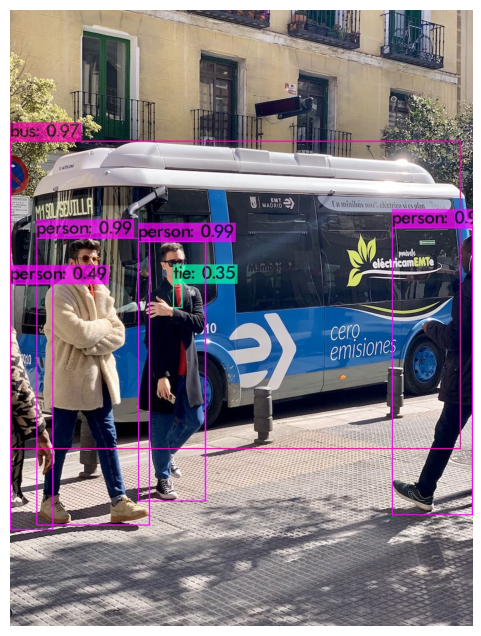

In [ ]:
def predictImage(imageDir):
  os.system("cd /content/darknet && ./darknet detect cfg/yolov4.cfg yolov4.weights {}".format(imageDir))
  image = cv2.imread("/content/darknet/predictions.jpg")
  height, width = image.shape[:2]
  resized_image = cv2.resize(image,(3*width, 3*height), interpolation = cv2.INTER_CUBIC)
  fig = plt.gcf()
  fig.set_size_inches(15, 8)
  plt.axis("off")
  plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
  plt.show()

predictImage("/content/bus.jpg")

# YOLOv5

100%|██████████| 48.2M/48.2M [00:00<00:00, 176MB/s]


100%|██████████| 476k/476k [00:00<00:00, 44.8MB/s]


image 1/1 /content/darknet/bus.jpg: 640x480 4 persons, 1 bus, 271.1ms
Speed: 9.5ms preprocess, 271.1ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 480)


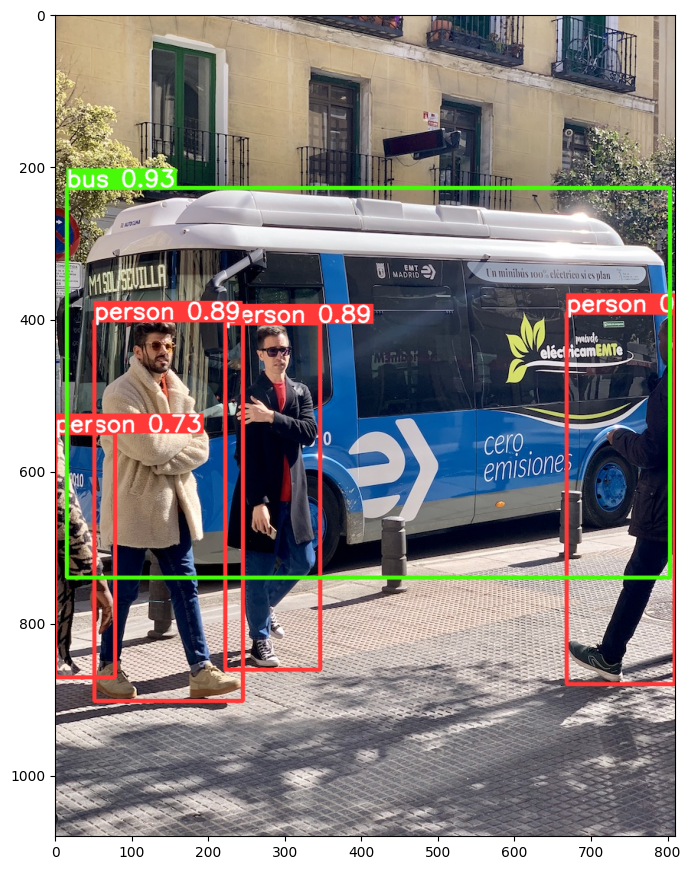

In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO('yolov5mu.pt')  # load an official model

# Predict with the model
results = model('https://ultralytics.com/images/bus.jpg')

show_img(results)

# YOLOv6

In [ ]:
%cd /content/

# Clone and install MT-YOLOv6
!git clone https://github.com/meituan/YOLOv6.git
!cd YOLOv6
!pip install -r requirements.txt

/content
Cloning into 'YOLOv6'...
remote: Enumerating objects: 3829, done.
remote: Counting objects: 100% (1709/1709), done.
remote: Compressing objects: 100% (326/326), done.
remote: Total 3829 (delta 1503), reused 1390 (delta 1383), pack-reused 2120
Receiving objects: 100% (3829/3829), 47.12 MiB | 14.94 MiB/s, done.
Resolving deltas: 100% (2335/2335), done.
ERROR: Could not open requirements file: [Errno 2] No such file or directory: 'requirements.txt'


In [ ]:
checkpoint:str ="yolov6s" #@param ["yolov6s", "yolov6n", "yolov6t"]
device:str = "gpu"#@param ["gpu", "cpu"]
half:bool = False #@param {type:"boolean"}
img_size = (640, 480)


import os, requests, torch, math, cv2
import numpy as np
import PIL
#Change directory so that imports wortk correctly
if os.getcwd()=="/content":
  os.chdir("YOLOv6")
from yolov6.utils.events import LOGGER, load_yaml
from yolov6.layers.common import DetectBackend
from yolov6.data.data_augment import letterbox
from yolov6.utils.nms import non_max_suppression
from yolov6.core.inferer import Inferer

from typing import List, Optional
#Download weights
if not os.path.exists(f"{checkpoint}.pt"):
  print("Downloading checkpoint...")
  os.system(f"""wget -c https://github.com/meituan/YOLOv6/releases/download/0.4.0/{checkpoint}.pt""")

#Set-up hardware options
cuda = device != 'cpu' and torch.cuda.is_available()
device = torch.device('cuda:0' if cuda else 'cpu')

def check_img_size(img_size, s=32, floor=0):
  def make_divisible( x, divisor):
    # Upward revision the value x to make it evenly divisible by the divisor.
    return math.ceil(x / divisor) * divisor
  """Make sure image size is a multiple of stride s in each dimension, and return a new shape list of image."""
  if isinstance(img_size, int):  # integer i.e. img_size=640
      new_size = max(make_divisible(img_size, int(s)), floor)
  elif isinstance(img_size, list):  # list i.e. img_size=[640, 480]
      new_size = [max(make_divisible(x, int(s)), floor) for x in img_size]
  else:
      raise Exception(f"Unsupported type of img_size: {type(img_size)}")

  if new_size != img_size:
      print(f'WARNING: --img-size {img_size} must be multiple of max stride {s}, updating to {new_size}')
  return new_size if isinstance(img_size,list) else [new_size]*2

def process_image(path, img_size, stride, half):
  '''Process image before image inference.'''
  try:
    from PIL import Image
    img_src = np.asarray(Image.open(requests.get(url, stream=True).raw))
    assert img_src is not None, f'Invalid image: {path}'
  except Exception as e:
    LOGGER.Warning(e)
  image = letterbox(img_src, img_size, stride=stride)[0]

  # Convert
  image = image.transpose((2, 0, 1))  # HWC to CHW
  image = torch.from_numpy(np.ascontiguousarray(image))
  image = image.half() if half else image.float()  # uint8 to fp16/32
  image /= 255  # 0 - 255 to 0.0 - 1.0

  return image, img_src


model = DetectBackend(f"./{checkpoint}.pt", device=device)
stride = model.stride
class_names = load_yaml("./data/coco.yaml")['names']

if half & (device.type != 'cpu'):
  model.model.half()
else:
  model.model.float()
  half = False

if device.type != 'cpu':
  model(torch.zeros(1, 3, *img_size).to(device).type_as(next(model.model.parameters())))  # warmup


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:844: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the .grad field to be populated for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations. (Triggered internally at aten/src/ATen/core/TensorBody.h:489.)
  if param.grad is not None:


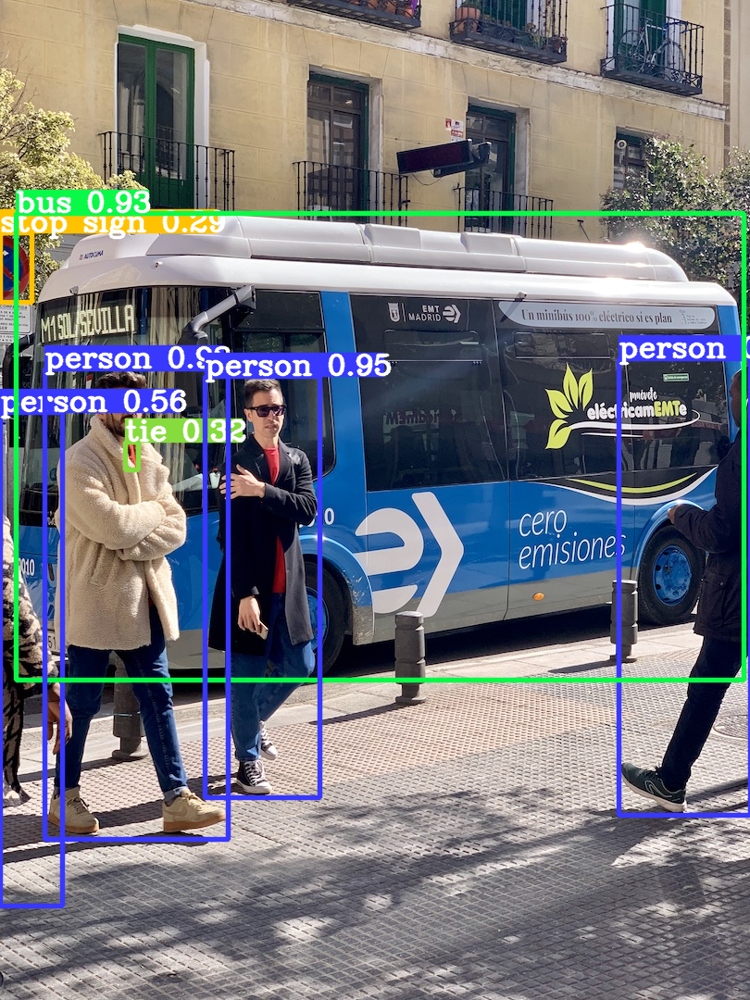

In [ ]:
url:str = "https://ultralytics.com/images/bus.jpg" #@param {type:"string"}
hide_labels: bool = False #@param {type:"boolean"}
hide_conf: bool = False #@param {type:"boolean"}



img_size:int = 640#@param {type:"integer"}

conf_thres: float =.25 #@param {type:"number"}
iou_thres: float =.45 #@param {type:"number"}
max_det:int =  1003#@param {type:"integer"}
agnostic_nms: bool = False #@param {type:"boolean"}


img_size = check_img_size(img_size, s=stride)

img, img_src = process_image(url, img_size, stride, half)
img = img.to(device)
if len(img.shape) == 3:
    img = img[None]
    # expand for batch dim
pred_results = model(img)
classes:Optional[List[int]] = None # the classes to keep
det = non_max_suppression(pred_results, conf_thres, iou_thres, classes, agnostic_nms, max_det=max_det)[0]

gn = torch.tensor(img_src.shape)[[1, 0, 1, 0]]  # normalization gain whwh
img_ori = img_src.copy()
if len(det):
  det[:, :4] = Inferer.rescale(img.shape[2:], det[:, :4], img_src.shape).round()
  for *xyxy, conf, cls in reversed(det):
      class_num = int(cls)
      label = None if hide_labels else (class_names[class_num] if hide_conf else f'{class_names[class_num]} {conf:.2f}')
      Inferer.plot_box_and_label(img_ori, max(round(sum(img_ori.shape) / 2 * 0.003), 2), xyxy, label, color=Inferer.generate_colors(class_num, True))
PIL.Image.fromarray(img_ori)

# YOLOv7

In [ ]:
%cd /content/

# Clone the github
!git clone https://github.com/WongKinYiu/yolov7

# # Dowbload the sample
!wget https://ultralytics.com/images/bus.jpg

%cd yolov7

# Download trained weights
!wget https://github.com/WongKinYiu/yolov7/releases/download/v0.1/yolov7-tiny.pt

/content
Cloning into 'yolov7'...
remote: Enumerating objects: 1197, done.
remote: Total 1197 (delta 0), reused 0 (delta 0), pack-reused 1197
Receiving objects: 100% (1197/1197), 74.23 MiB | 10.98 MiB/s, done.
Resolving deltas: 100% (520/520), done.
--2023-12-28 14:42:39--  https://ultralytics.com/images/bus.jpg
Resolving ultralytics.com (ultralytics.com)... 99.83.190.102, 75.2.70.75
Connecting to ultralytics.com (ultralytics.com)|99.83.190.102|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://www.ultralytics.com/images/bus.jpg [following]
--2023-12-28 14:42:40--  https://www.ultralytics.com/images/bus.jpg
Resolving www.ultralytics.com (www.ultralytics.com)... 104.18.0.125, 104.18.1.125, 2606:4700::6812:17d, ...
Connecting to www.ultralytics.com (www.ultralytics.com)|104.18.0.125|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://raw.githubusercontent.com/ultralytics/yolov5/master/data/imag

In [ ]:
!python detect.py --weights ./yolov7-tiny.pt --conf 0.25 --img-size 640 --source /content/bus.jpg

Namespace(weights=['./yolov7-tiny.pt'], source='/content/bus.jpg', img_size=640, conf_thres=0.25, iou_thres=0.45, device='', view_img=False, save_txt=False, save_conf=False, nosave=False, classes=None, agnostic_nms=False, augment=False, update=False, project='runs/detect', name='exp', exist_ok=False, no_trace=False)
YOLOR 🚀 v0.1-128-ga207844 torch 2.1.0+cu121 CUDA:0 (Tesla T4, 15102.0625MB)

Fusing layers... 
/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Model Summary: 200 layers, 6219709 parameters, 229245 gradients, 13.7 GFLOPS
 Convert model to Traced-model... 
 traced_script_module saved! 
 model is traced! 

4 persons, 1 bus, Done. (16.2ms) Inference, (1053.9ms) NMS
 The image with the result is saved in: runs/detect/ex

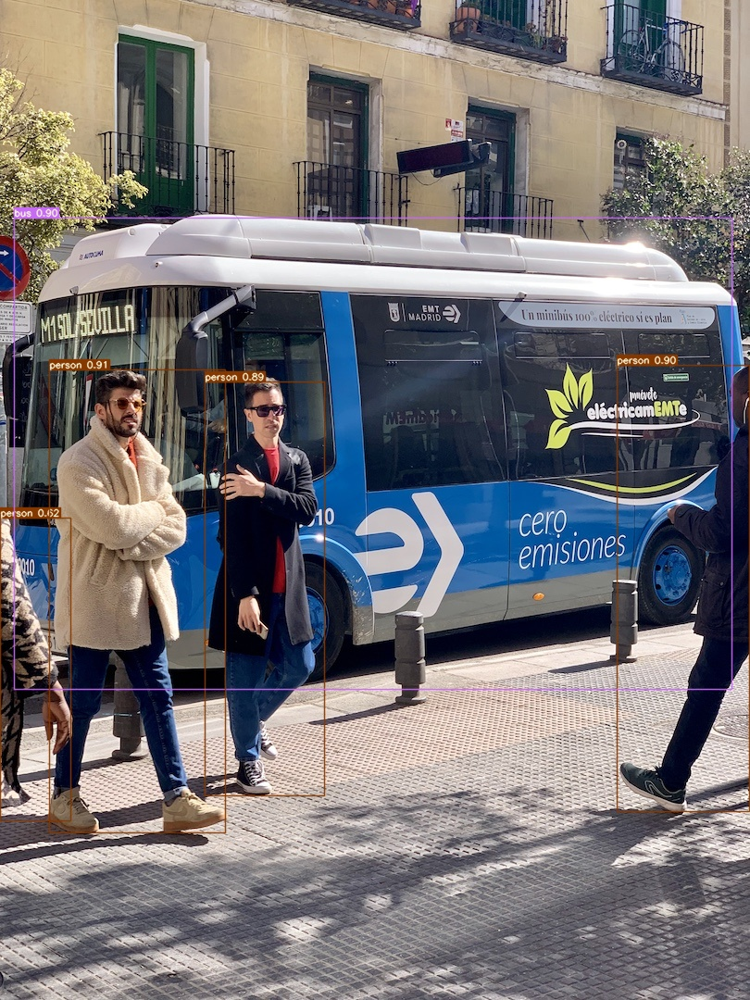

In [ ]:
Image.open('/content/yolov7/runs/detect/exp/bus.jpg')

# YOLOv8

100%|██████████| 6.23M/6.23M [00:00<00:00, 187MB/s]


100%|██████████| 476k/476k [00:00<00:00, 88.4MB/s]

image 1/1 /content/yolov7/bus.jpg: 640x480 4 persons, 1 bus, 1 stop sign, 47.1ms
Speed: 2.3ms preprocess, 47.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


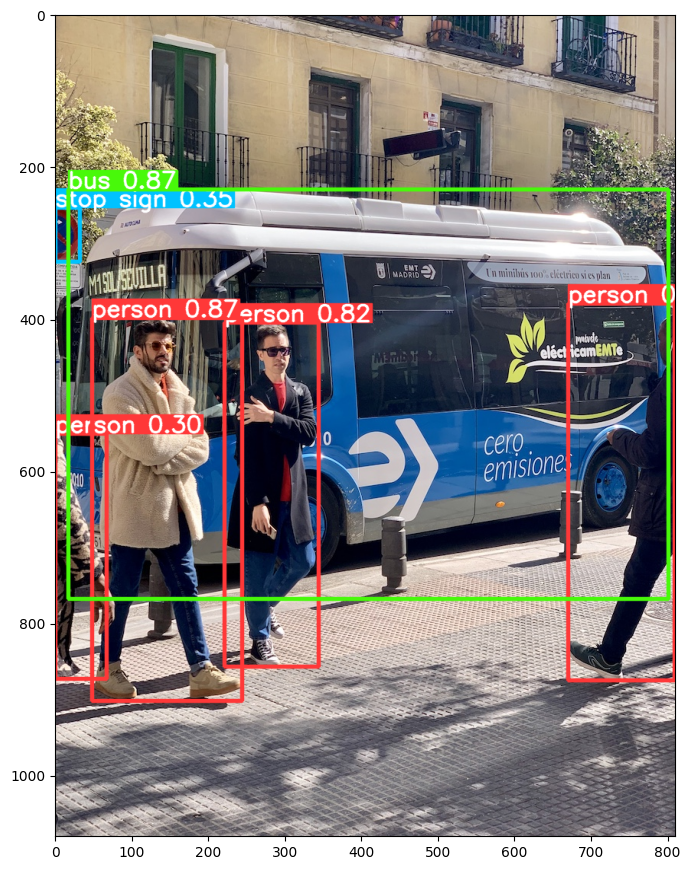

In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO('yolov8n.pt')  # load an official model

# Predict with the model
results = model('https://ultralytics.com/images/bus.jpg')

show_img(results)

# Summary

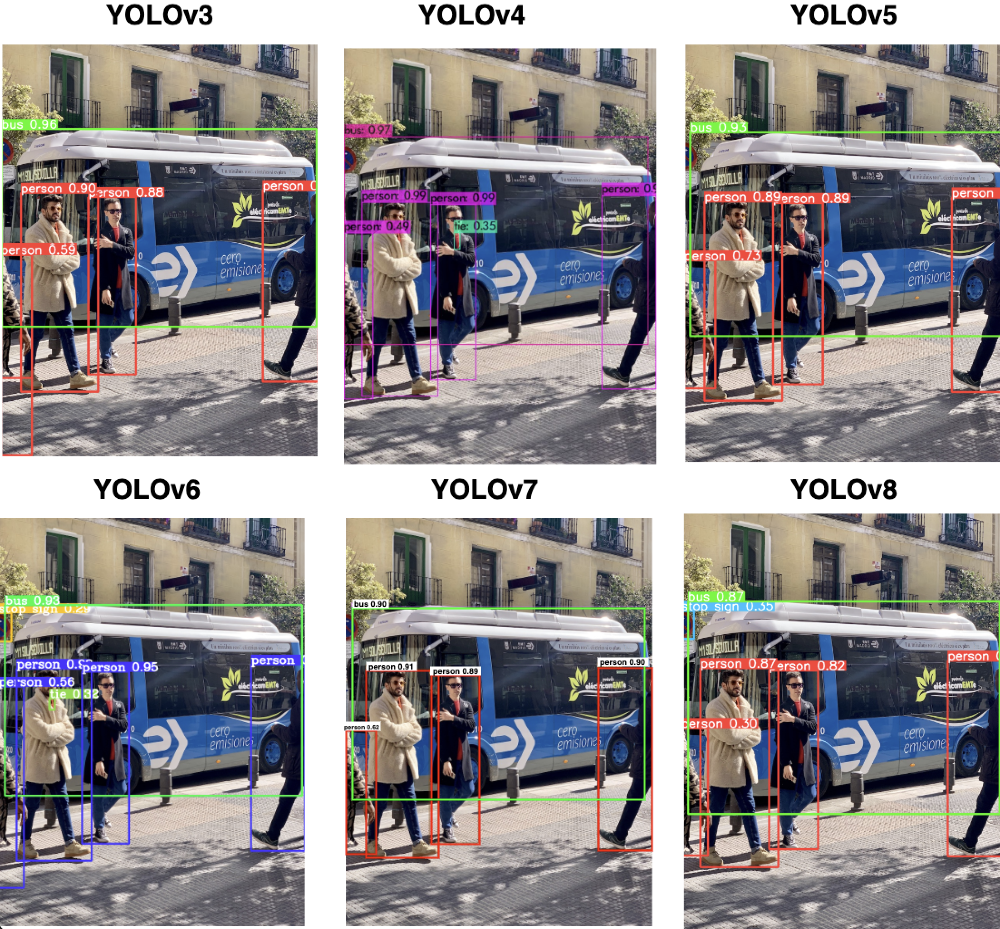